In [1]:
import os
import numpy as np
from PIL import Image
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import cv2

In [31]:
class ROOTDIR:
    root = "/data1/vinod/mitosis/data/processed"

In [32]:
train_img_lst = os.listdir(os.path.join(ROOTDIR.root, 'train', 'input')) # "./train"
train_mask_lst = os.listdir(os.path.join(ROOTDIR.root, 'train', 'output')) # "./train_masks"
val_img_lst = os.listdir(os.path.join(ROOTDIR.root, 'val', 'input')) # "./val"
val_mask_lst = os.listdir(os.path.join(ROOTDIR.root, 'val', 'output')) # "./val_masks"

In [33]:
print(train_mask_lst[:5])
print(train_img_lst[:5])
print(val_mask_lst[:5])
print(val_img_lst[:5])

['A02_05.png', 'H00_01.png', 'H02_05.png', 'A00_01.png', 'A00_03.png']
['A02_05.png', 'H00_01.png', 'H02_05.png', 'A00_01.png', 'A00_03.png']
['A00_02.png', 'A01_01.png', 'A01_08.png', 'A02_03.png', 'A02_08.png']
['A00_02.png', 'A01_01.png', 'A01_08.png', 'A02_03.png', 'A02_08.png']


In [34]:
print(len(train_mask_lst))
print(len(train_img_lst))
print(len(val_mask_lst))
print(len(val_img_lst))

79
79
19
19


In [35]:
sorted_train_mask_lst = sorted(train_mask_lst)
sorted_train_img_lst = sorted(train_img_lst)
sorted_val_mask_lst = sorted(val_mask_lst)
sorted_val_img_lst = sorted(val_img_lst)

/data1/vinod/mitosis/data/processed/train/input/A00_01.png
(2084, 2084)


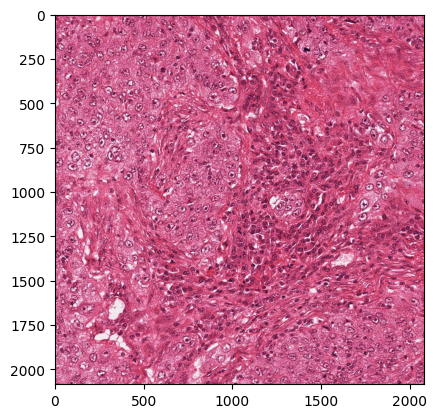

/data1/vinod/mitosis/data/processed/train/output/A00_01.png
(2084, 2084)


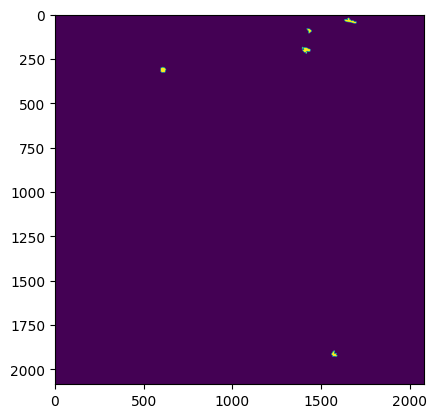

----------------------------------------------------
/data1/vinod/mitosis/data/processed/train/input/A00_03.png
(2084, 2084)


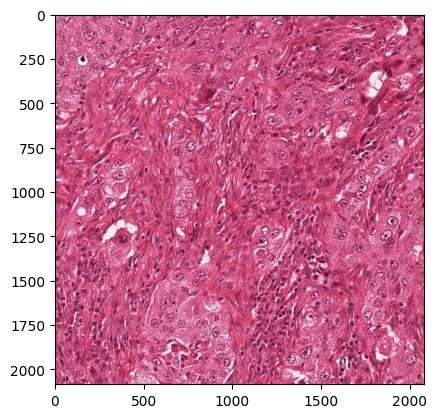

/data1/vinod/mitosis/data/processed/train/output/A00_03.png
(2084, 2084)


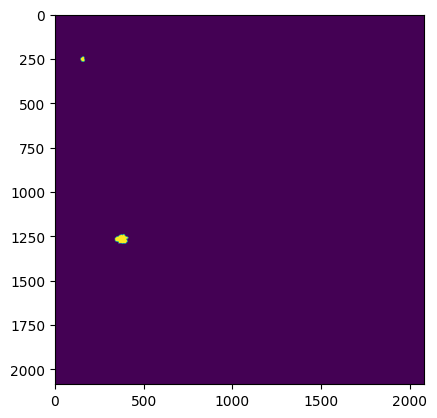

----------------------------------------------------


In [36]:
def show_images(imgs_lst,masks_lst,type='train',loops=2):
    for i in range(loops):
        img_path = os.path.join(ROOTDIR.root,type,'input',imgs_lst[i])
        mask_path = os.path.join(ROOTDIR.root,type,'output', masks_lst[i])
        img = Image.open(img_path)
        mask = Image.open(mask_path)
        print(img_path)
        print(img.size)
        # print(type(img))
        plt.imshow(img)
        plt.show()
        print(mask_path)
        print(mask.size)
        plt.imshow(mask)
        plt.show()
        print("----------------------------------------------------")

show_images(sorted_train_img_lst, sorted_train_mask_lst, type='train')

### Pytorch Implementation

In [2]:
import torch
import torchvision
import torch.nn as nn
import albumentations as A
import torch.optim as optim
from torchvision import models
import torch.nn.functional as F
from torch.optim import lr_scheduler
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from albumentations.pytorch import ToTensorV2 
from torch.utils.data import DataLoader, Dataset

#### Configurations

In [3]:
class CFG:
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    split_pct = 0.2
    learning_rate = 3e-4
    batch_size = 8
    epochs = 50

In [4]:
seed = 123
np.random.seed(seed)
torch.manual_seed(seed)

In [5]:
CFG.device

device(type='cuda')

#### Workign with data

##### Shuffling the data

In [41]:
permuted_train_img_lst = np.random.permutation(np.array(sorted_train_img_lst))
permuted_train_mask_lst = [x for x in permuted_train_img_lst]
print(permuted_train_img_lst[:5])
print(permuted_train_mask_lst[:5])

['H03_01.png' 'H02_04.png' 'H02_05.png' 'A00_06.png' 'H03_08.png']
['H03_01.png', 'H02_04.png', 'H02_05.png', 'A00_06.png', 'H03_08.png']


/data1/vinod/mitosis/data/processed/train/input/H03_01.png
(2252, 2250)


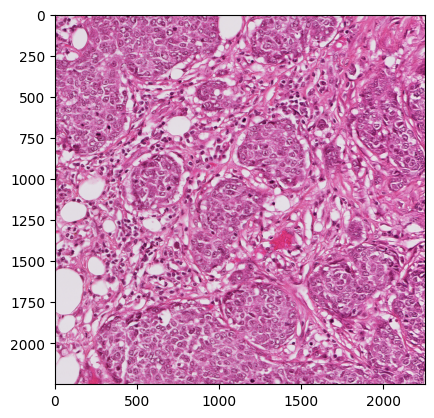

/data1/vinod/mitosis/data/processed/train/output/H03_01.png
(2252, 2250)


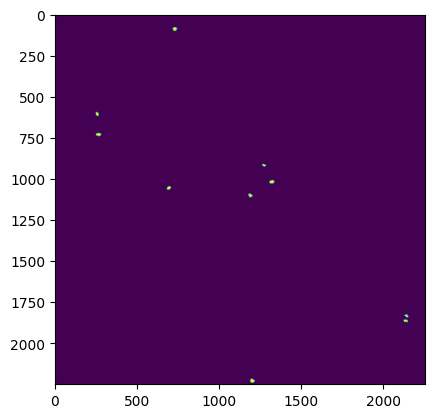

----------------------------------------------------
/data1/vinod/mitosis/data/processed/train/input/H02_04.png
(2252, 2250)


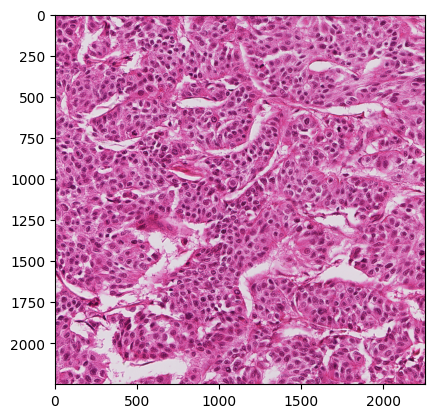

/data1/vinod/mitosis/data/processed/train/output/H02_04.png
(2252, 2250)


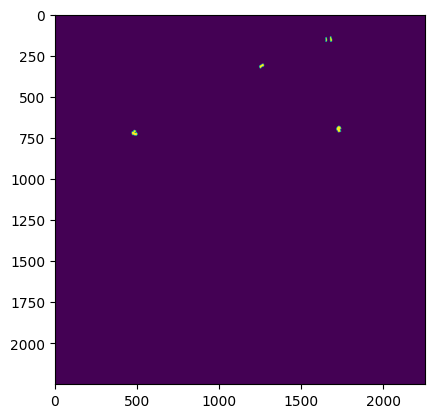

----------------------------------------------------


In [42]:
show_images(permuted_train_img_lst,permuted_train_mask_lst, type='train')

In [43]:
train_images_list = permuted_train_img_lst
train_masks_list = permuted_train_mask_lst
print(len(train_masks_list))

val_images_list = val_img_lst
val_masks_list = val_mask_lst
print(len(val_masks_list))

79
19


#### Visualizing Train Dataset

/data1/vinod/mitosis/data/processed/train/input/H03_01.png
(2252, 2250)


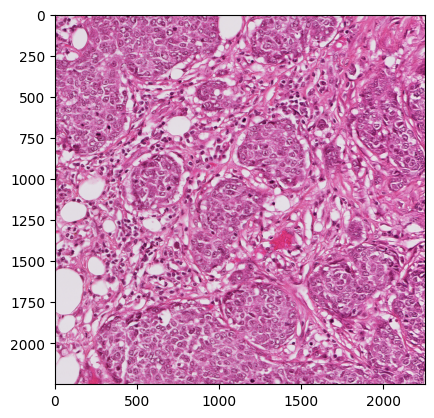

/data1/vinod/mitosis/data/processed/train/output/H03_01.png
(2252, 2250)


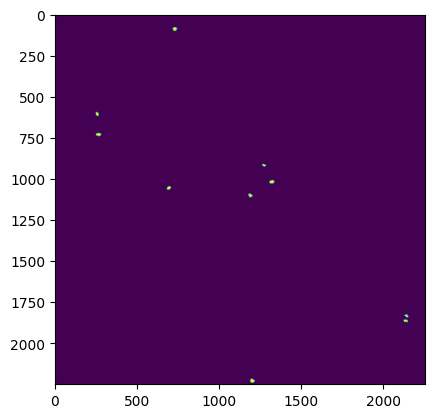

----------------------------------------------------
/data1/vinod/mitosis/data/processed/train/input/H02_04.png
(2252, 2250)


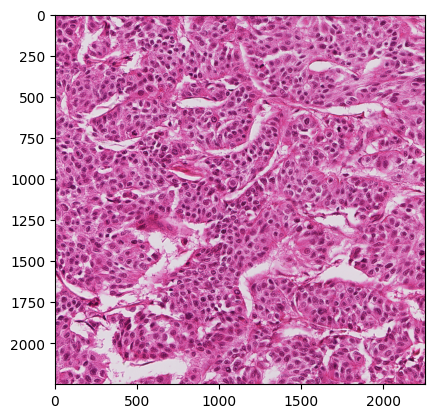

/data1/vinod/mitosis/data/processed/train/output/H02_04.png
(2252, 2250)


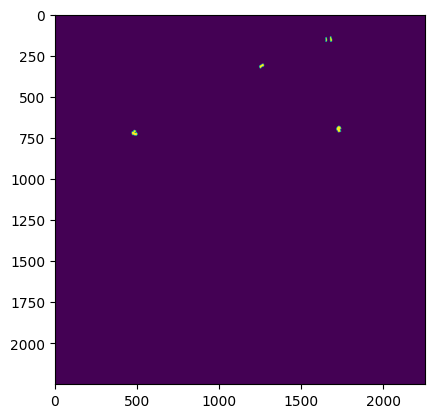

----------------------------------------------------


In [44]:
show_images(train_images_list,train_masks_list,type='train')

##### Visualizing Val Dataset

/data1/vinod/mitosis/data/processed/val/input/A00_02.png
(2084, 2084)


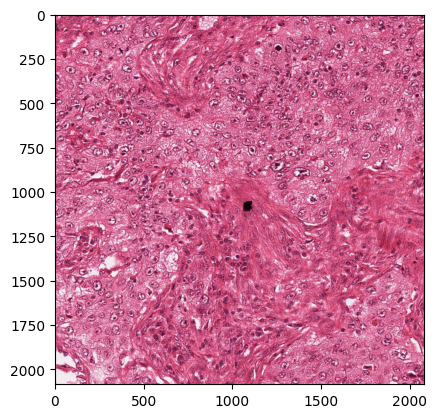

/data1/vinod/mitosis/data/processed/val/output/A00_02.png
(2084, 2084)


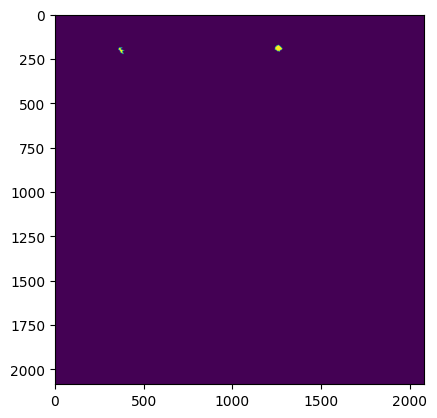

----------------------------------------------------
/data1/vinod/mitosis/data/processed/val/input/A01_01.png
(2084, 2084)


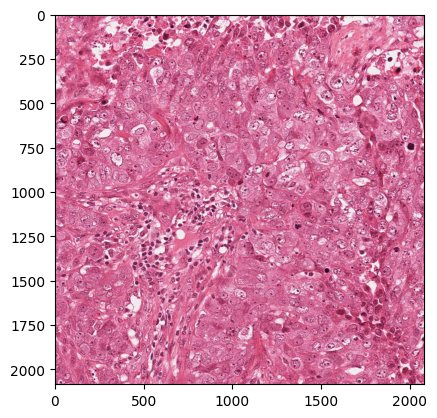

/data1/vinod/mitosis/data/processed/val/output/A01_01.png
(2084, 2084)


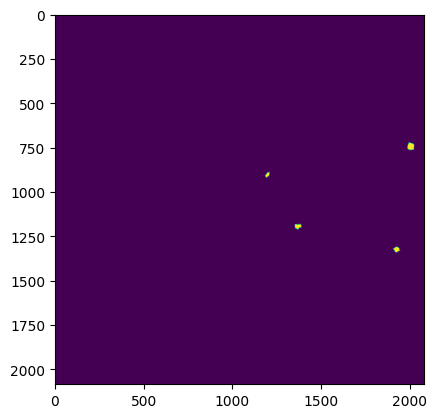

----------------------------------------------------


In [45]:
show_images(val_images_list,val_masks_list,type='val')

#### Dataset Class

In [6]:
class MitosisDataset(Dataset):
    def __init__(self,img_list,mask_list,type=None,transform=None):
        self.img_list = img_list
        self.mask_list = mask_list
        self.transform = transform
        self.type = type
        
    def __len__(self):
        return len(self.img_list)
    
    def __getitem__(self,index):
        img_path = os.path.join(ROOTDIR.root, self.type, 'input', self.img_list[index])
        mask_path = os.path.join(ROOTDIR.root, self.type, 'output', self.mask_list[index])
        img = Image.open(img_path)
        mask = Image.open(mask_path)
        img = np.array(img)
        mask = np.array(mask)
        mask[mask==255.0] = 1.0

        if self.transform:
            augmentation = self.transform(image=img, mask=mask)
            img = augmentation["image"]
            mask = augmentation["mask"]
            mask = torch.unsqueeze(mask,0)

            
        return img,mask

In [47]:
train_transform = A.Compose([A.Resize(572,572), 
                             A.Rotate(limit=15,p=0.1),
                             A.HorizontalFlip(p=0.5),
                             A.Normalize(mean=(0,0,0),std=(1,1,1),max_pixel_value=255),
                             ToTensorV2()])

val_transform = A.Compose([A.Resize(572,572),
                           A.Normalize(mean=(0,0,0),std=(1,1,1),max_pixel_value=255),
                           ToTensorV2()])

In [48]:
train_dataset = MitosisDataset(train_images_list, train_masks_list, type='train', transform = train_transform)
val_dataset = MitosisDataset(val_images_list, val_masks_list, type='val', transform = val_transform)

In [49]:
idx = 10
img,mask = train_dataset[idx]

In [50]:
mask.shape

torch.Size([1, 572, 572])

In [51]:
img.max()

tensor(1.)

In [52]:
def show_single_img(img,mask,index=None,train=True):
    if index:
        if train:
            img,mask = train_dataset[index]
        else:
            img,mask = val_dataset[index]
    plt.imshow(img.permute(1,2,0),cmap="gray")  # Convert (3, 572, 572) -> (572, 572, 3)
    plt.show()
    plt.imshow(mask.permute(1,2,0), cmap="gray")  # Convert (1, 572, 572) -> (572, 572, 1)
    print(mask.shape)
    plt.show()

---------------Train---------------


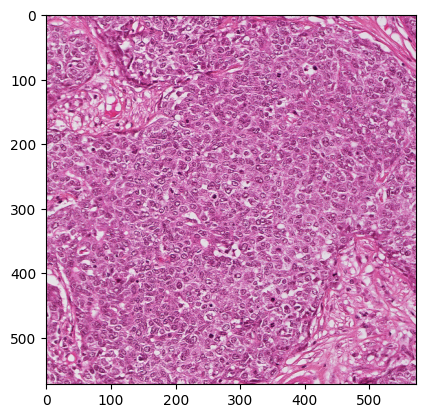

torch.Size([1, 572, 572])


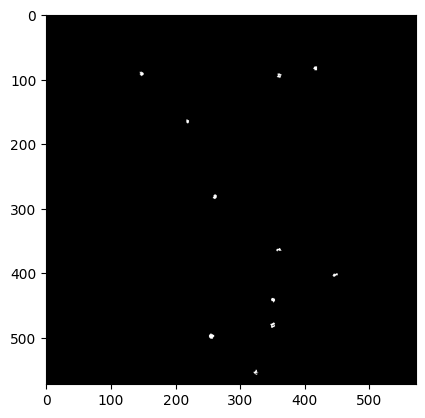

---------------Validation---------------


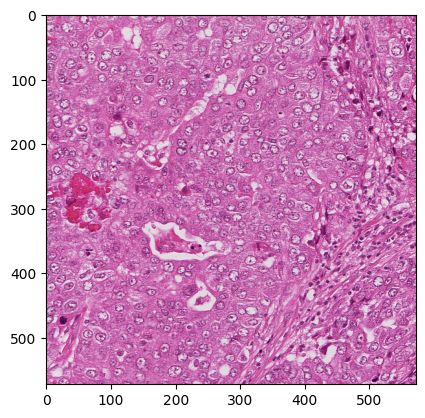

torch.Size([1, 572, 572])


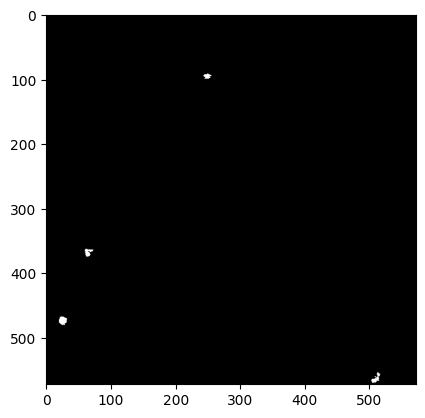

In [53]:
print("---------------Train---------------")
show_single_img(img,mask,index=15,train=False)
print("---------------Validation---------------")
show_single_img(img,mask,index=15,train=True)

#### Data Loader

In [54]:
train_dataloader = DataLoader(train_dataset,batch_size=CFG.batch_size,shuffle=True)
val_dataloader = DataLoader(val_dataset,batch_size=CFG.batch_size,shuffle=False)

In [55]:
a = train_dataloader
img,mask = next(iter(a))
print(img.shape,mask.shape)

torch.Size([8, 3, 572, 572]) torch.Size([8, 1, 572, 572])


#### Utility functions

In [7]:
def double_conv(in_ch, out_ch):
    conv = nn.Sequential(
        nn.Conv2d(in_channels=in_ch,out_channels=out_ch,kernel_size=3,stride=1,padding=1),
        nn.BatchNorm2d(out_ch),                                                            
        nn.ReLU(inplace=True),
        nn.Conv2d(in_channels=out_ch,out_channels=out_ch,kernel_size=3,stride=1,padding=1), 
        nn.BatchNorm2d(out_ch),                                                            
        nn.ReLU(inplace=True)
    )
    
    return conv

#def cropper(og_tensor, target_tensor):
#    og_shape = og_tensor.shape[2]
#    target_shape = target_tensor.shape[2]
#    delta = (og_shape - target_shape) // 2
#    cropped_og_tensor = og_tensor[:,:,delta:og_shape-delta,delta:og_shape-delta]
#    return cropped_og_tensor
 
    
def padder(left_tensor, right_tensor): 
    # left_tensor is the tensor on the encoder side of UNET
    # right_tensor is the tensor on the decoder side  of the UNET
    
    if left_tensor.shape != right_tensor.shape:
        padded = torch.zeros(left_tensor.shape)
        padded[:, :, :right_tensor.shape[2], :right_tensor.shape[3]] = right_tensor
        return padded.to(CFG.device)
    
    return right_tensor.to(CFG.device)

#### UNet Model

In [10]:
class UNET(nn.Module):
    def __init__(self,in_chnls, n_classes):
        super(UNET,self).__init__()
        
        self.in_chnls = in_chnls
        self.n_classes = n_classes
        
        self.max_pool = nn.MaxPool2d(kernel_size=2,stride=2)
        
        self.down_conv_1 = double_conv(in_ch=self.in_chnls,out_ch=64)
        self.down_conv_2 = double_conv(in_ch=64,out_ch=128)
        self.down_conv_3 = double_conv(in_ch=128,out_ch=256)
        self.down_conv_4 = double_conv(in_ch=256,out_ch=512)
        self.down_conv_5 = double_conv(in_ch=512,out_ch=1024)
        #print(self.down_conv_1)
        
        self.up_conv_trans_1 = nn.ConvTranspose2d(in_channels=1024,out_channels=512,kernel_size=2,stride=2)
        self.up_conv_trans_2 = nn.ConvTranspose2d(in_channels=512,out_channels=256,kernel_size=2,stride=2)
        self.up_conv_trans_3 = nn.ConvTranspose2d(in_channels=256,out_channels=128,kernel_size=2,stride=2)
        self.up_conv_trans_4 = nn.ConvTranspose2d(in_channels=128,out_channels=64,kernel_size=2,stride=2)
        
        self.up_conv_1 = double_conv(in_ch=1024,out_ch=512)
        self.up_conv_2 = double_conv(in_ch=512,out_ch=256)
        self.up_conv_3 = double_conv(in_ch=256,out_ch=128)
        self.up_conv_4 = double_conv(in_ch=128,out_ch=64)
        
        self.conv_1x1 = nn.Conv2d(in_channels=64,out_channels=self.n_classes,kernel_size=1,stride=1)
        
    def forward(self,x):
        
        # encoding
        x1 = self.down_conv_1(x)
        #print("X1", x1.shape)
        p1 = self.max_pool(x1)
        #print("p1", p1.shape)
        x2 = self.down_conv_2(p1)
        #print("X2", x2.shape)
        p2 = self.max_pool(x2)
        #print("p2", p2.shape)
        x3 = self.down_conv_3(p2)
        #print("X2", x3.shape)
        p3 = self.max_pool(x3)
        #print("p3", p3.shape)
        x4 = self.down_conv_4(p3)
        #print("X4", x4.shape)
        p4 = self.max_pool(x4)
        #print("p4", p4.shape)
        x5 = self.down_conv_5(p4)
        #print("X5", x5.shape)
        
        # decoding
        d1 = self.up_conv_trans_1(x5)  # up transpose convolution ("up sampling" as called in UNET paper)
        pad1 = padder(x4,d1) # padding d1 to match x4 shape
        cat1 = torch.cat([x4,pad1],dim=1) # concatenating padded d1 and x4 on channel dimension(dim 1) [batch(dim 0),channel(dim 1),height(dim 2),width(dim 3)]
        uc1 = self.up_conv_1(cat1) # 1st up double convolution
        
        d2 = self.up_conv_trans_2(uc1)
        pad2 = padder(x3,d2)
        cat2 = torch.cat([x3,pad2],dim=1)
        uc2 = self.up_conv_2(cat2)
        
        d3 = self.up_conv_trans_3(uc2)
        pad3 = padder(x2,d3)
        cat3 = torch.cat([x2,pad3],dim=1)
        uc3 = self.up_conv_3(cat3)
        
        d4 = self.up_conv_trans_4(uc3)
        pad4 = padder(x1,d4)
        cat4 = torch.cat([x1,pad4],dim=1)
        uc4 = self.up_conv_4(cat4)
        
        conv_1x1 = self.conv_1x1(uc4)
        return conv_1x1
        #print(conv_1x1.shape)

In [8]:
def dice_loss(preds, targets):
    smooth = 1e-7
    intersection = torch.sum(preds * targets)
    union = torch.sum(preds) + torch.sum(targets)
    dice = (2. * intersection + smooth) / (union + smooth)
    return 1 - dice

In [59]:
model = UNET(in_chnls = 3, n_classes = 1).to(CFG.device)
optimizer = optim.Adam(model.parameters(), lr = CFG.learning_rate)
criterion = nn.BCEWithLogitsLoss()
criterion_dice = dice_loss
train_loss_lst = []
val_loss_lst = []
val_diceloss_lst = [] 

#### Train and Validation

##### Train

In [60]:
def train_model(model,dataloader,criterion,optimizer):
    model.train()
    train_running_loss = 0.0
    for j,img_mask in enumerate(tqdm(dataloader)):
        img = img_mask[0].float().to(CFG.device)
        #print(" ----- IMAGE -----")
        #print(img)
        mask = img_mask[1].float().to(CFG.device)
        #print(" ----- MASK -----")
        #print(mask)
        
        y_pred = model(img)
        #print(" ----- Y PRED -----")
        #print(y_pred)
        #print(" ----- Y PRED SHAPE -----")#
        #print(y_pred.shape)
        optimizer.zero_grad()
        
        loss = criterion(y_pred,mask)
        
        train_running_loss += loss.item() * CFG.batch_size
        
        loss.backward()
        optimizer.step()
        
    train_loss = train_running_loss / (j+1)
    return train_loss

##### Validation

In [61]:
def val_model(model,dataloader,criterion,criterion_dice,optimizer):
    model.eval()
    val_running_loss = 0
    val_running_diceloss = 0
    with torch.no_grad():
        for j,img_mask in enumerate(tqdm(dataloader)):
            img = img_mask[0].float().to(CFG.device)
            mask = img_mask[1].float().to(CFG.device)
            y_pred = model(img)
            
            loss = criterion(y_pred,mask)
            val_running_loss += loss.item() * CFG.batch_size

            diceloss = criterion_dice(y_pred,mask)
            val_running_diceloss += diceloss.item() * CFG.batch_size
            
        val_loss = val_running_loss / (j+1)
        val_diceloss = val_running_diceloss / (j+1)
    return val_loss, val_diceloss

#### Train and Validation Loop

In [62]:
for i in tqdm(range(CFG.epochs)):
    train_loss = train_model(model=model,dataloader=train_dataloader,criterion=criterion,optimizer=optimizer)
    val_loss, val_diceloss = val_model(model=model,dataloader=val_dataloader,criterion=criterion,criterion_dice=criterion_dice,optimizer=optimizer)
    train_loss_lst.append(train_loss)
    val_loss_lst.append(val_loss)
    val_diceloss_lst.append(val_diceloss)
    print(f" Train Loss : {train_loss:.4f}")
    print(f" Validation Loss : {val_loss:.4f}")
    print(f" Validation Dice Loss : {val_diceloss:.4f}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 Train Loss : 4.1493
 Validation Loss : 4.7982
 Validation Dice Loss : 7.9842


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 Train Loss : 2.9946
 Validation Loss : 31.7921
 Validation Dice Loss : 7.9818


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

 Train Loss : 2.3525
 Validation Loss : 2.6424
 Validation Dice Loss : 7.9845


  0%|          | 0/10 [00:00<?, ?it/s]

KeyboardInterrupt: 

#### Training and Validation Loss Plot

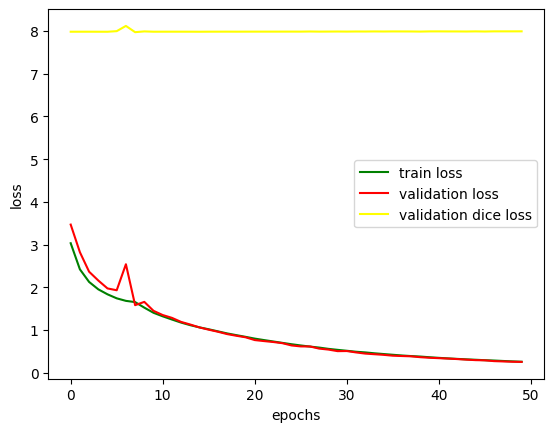

In [ ]:
plt.plot(train_loss_lst, color="green", label='train loss')
plt.plot(val_loss_lst, color="red", label='validation loss')
plt.plot(val_diceloss_lst, color="yellow", label='validation dice loss')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

#### Saving Model

In [ ]:
TRAINED_FILE = "/home/vinod/Documents/mitosis_detection/models/UNet/version1.1/unet.pth"

In [ ]:
torch.save(model.state_dict(), TRAINED_FILE)

In [ ]:
from IPython.display import FileLink
FileLink(TRAINED_FILE)

/home/vinod/Documents/mitosis_detection/models/UNet/version1.1/unet.pth

#### Testing

In [11]:
trained_model = UNET(in_chnls = 3, n_classes = 1)
UNET_TRAINED = "/home/vinod/Documents/mitosis_detection/models/UNet/checkpoint_epoch0.pth"
trained_model.load_state_dict(torch.load(UNET_TRAINED))

<All keys matched successfully>

In [12]:
trained_model = trained_model.to("cuda")
trained_model.eval()

UNET(
  (max_pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down_conv_1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down_conv_2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (down_conv_3): Sequential(
    (0): Conv2d(128, 256, kernel_size=

(2250, 2252, 3)


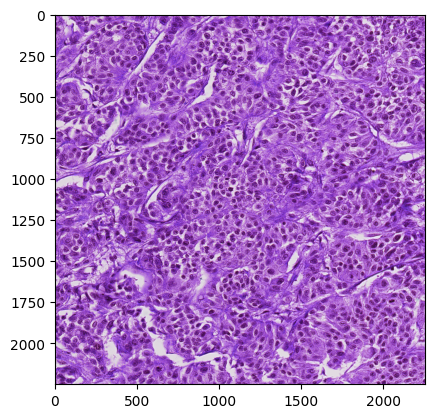

In [13]:
img_path = "/data1/vinod/mitosis/data/processed/val/input/H02_01.png"
img = cv2.imread(img_path)
print(img.shape)
plt.imshow(img)
plt.show()

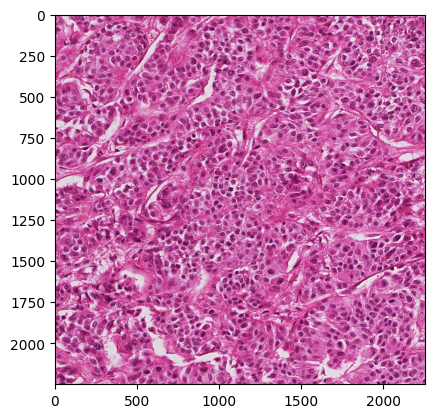

In [16]:
img_path = "/data1/vinod/mitosis/data/processed/val/input/H02_01.png"
img = Image.open(img_path)
plt.imshow(img)
plt.show()

[  0 255]
(2250, 2252, 3)


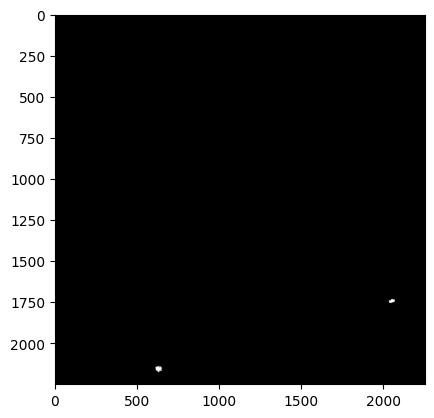

In [83]:
mask_path = "/data1/vinod/mitosis/data/processed/val/output/H02_01.png"
mask = cv2.imread(mask_path)
print(np.unique(mask))
# mask[mask==255.0] = 1.0
print(mask.shape)
plt.imshow(mask)
plt.show()

[  0 255]


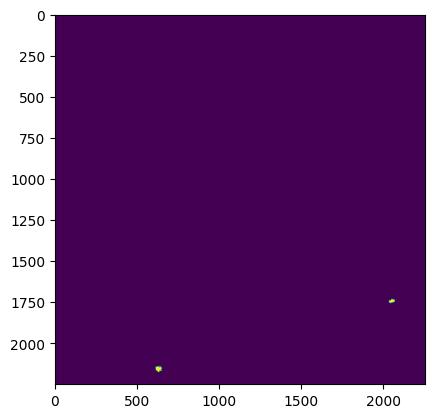

In [19]:
mask_path = "/data1/vinod/mitosis/data/processed/val/output/H02_01.png"
mask = Image.open(mask_path)
print(np.unique(mask))
# mask[mask==255.0] = 1.0
plt.imshow(mask)
plt.show()

In [21]:
test_transform = A.Compose([A.Resize(512,512),
                           A.Normalize(mean=(0,0,0),std=(1,1,1),max_pixel_value=255),
                           ToTensorV2()])

test_image = test_transform(image = np.asarray(img))

print(test_image["image"].dtype)
print(test_image["image"].shape)

img = test_image["image"].unsqueeze(0)
print(img.shape)

img = img.to("cuda")

torch.float32
torch.Size([3, 512, 512])
torch.Size([1, 3, 512, 512])


In [85]:
test_mask = test_transform(image = np.asarray(mask))
print(test_mask["image"].dtype)
print(test_mask["image"].shape)
print(test_mask["image"].permute(1, 2, 0).shape)

masks = test_mask["image"].unsqueeze(0)
print(masks.shape)


torch.float32
torch.Size([3, 512, 512])
torch.Size([512, 512, 3])
torch.Size([1, 3, 512, 512])


In [22]:
pred = trained_model(img)
pred.shape

torch.Size([1, 1, 512, 512])

In [23]:
color_map = {
    0:(0,0,0),
    1:(255,0,0),
}

def prediction_to_vis(prediction):
    vis_shape = prediction.shape + (3,)
    vis = np.zeros(vis_shape)
    for i,c in color_map.items():
        vis[prediction == i] = color_map[i]
    return Image.fromarray(vis.astype(np.uint8))


In [88]:
pred_mask = pred.squeeze(0).cpu().detach().numpy()
print(pred_mask.shape)
pred_mask = pred_mask.transpose(1,2,0)
print(pred_mask.shape)

np.unique(pred_mask)

(1, 512, 512)
(512, 512, 1)


array([-0.50005245, -0.499044  , -0.49627307, ...,  0.55182236,
        0.5521283 ,  0.552272  ], dtype=float32)

In [89]:
pred_mask[pred_mask < 0]=0
pred_mask[pred_mask > 0]=1

np.unique(pred_mask)

array([0., 1.], dtype=float32)

In [90]:
pred_mask.shape

(512, 512, 1)

In [91]:
masks.shape

torch.Size([1, 3, 512, 512])

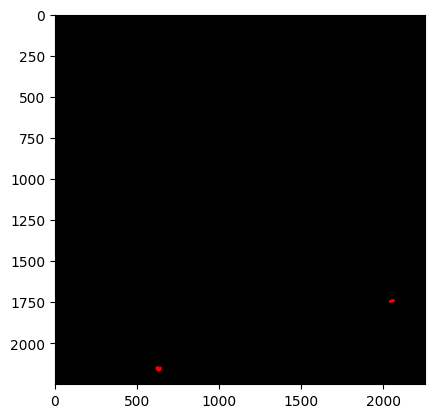

In [29]:
test_mask = np.copy(np.asarray(mask))
test_mask[test_mask==255] = 1

plt.imshow(prediction_to_vis(test_mask))

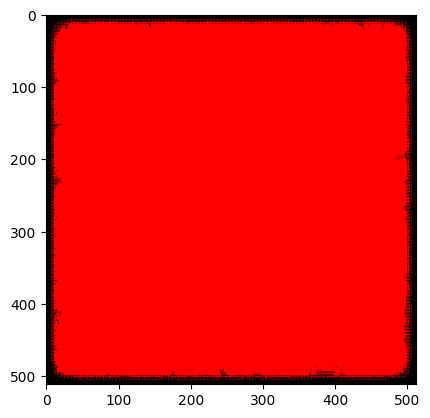

In [92]:
plt.imshow(prediction_to_vis(np.squeeze(pred_mask)))
plt.show()

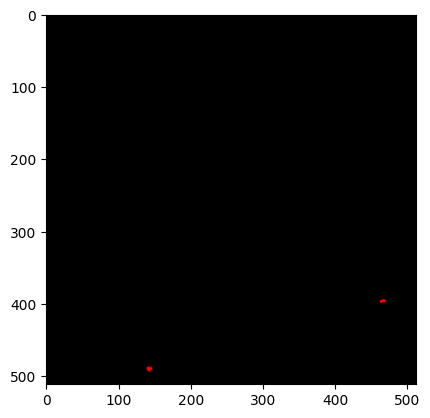

In [93]:
masks = masks.squeeze()
masks = masks.permute(1,2,0)
# Convert to single channel by selecting one channel (e.g., red channel)
single_channel_image = masks[..., 0]

# Add an extra dimension using unsqueeze()
# single_channel_image = single_channel_image.unsqueeze(-1)


plt.imshow(prediction_to_vis(np.squeeze(single_channel_image)))
plt.show()

In [14]:
Image.open(img_path).size

(2252, 2250)

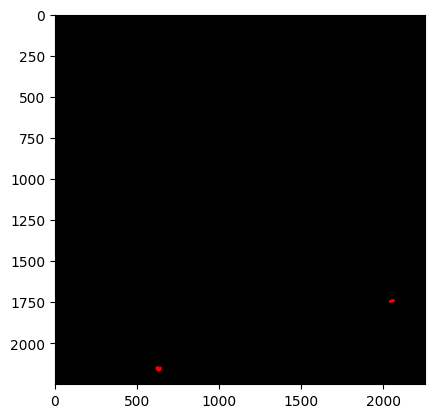

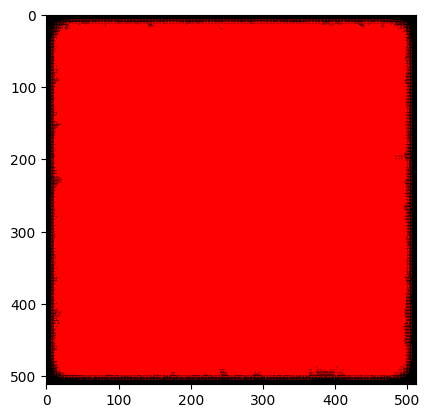

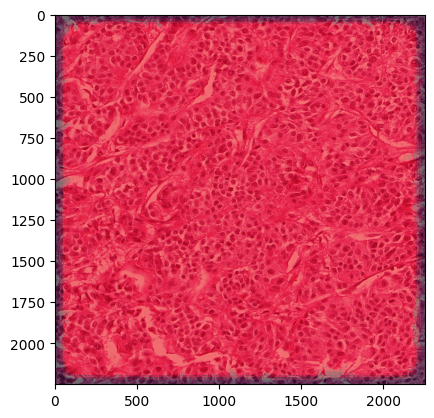

In [38]:
img = Image.open(img_path)

test_transform = A.Compose([A.Resize(512,512),
                           A.Normalize(mean=(0,0,0),std=(1,1,1),max_pixel_value=255),
                           ToTensorV2()])

test_image = test_transform(image = np.asarray(img))
test_image = test_image["image"].unsqueeze(0)
test_image = test_image.to("cuda")


pred_mask = trained_model(test_image)


mask = Image.open(mask_path)
test_mask = np.copy(np.asarray(mask))
test_mask[test_mask==255] = 1

plt.imshow(prediction_to_vis(test_mask))
plt.show()

pred_mask = pred_mask.squeeze(0).cpu().detach().numpy()
pred_mask = pred_mask.transpose(1,2,0)
pred_mask[pred_mask < 0]=0
pred_mask[pred_mask > 0]=1

plt.imshow(prediction_to_vis(np.squeeze(pred_mask)))
plt.show()

pred_mask = prediction_to_vis(np.squeeze(pred_mask))
pred_mask = pred_mask.resize(img.size)
input_img = img.convert("RGBA")
pred_mask = pred_mask.convert("RGBA")
overlay_img = Image.blend(input_img, pred_mask, 0.5)
plt.imshow(overlay_img)
plt.show()

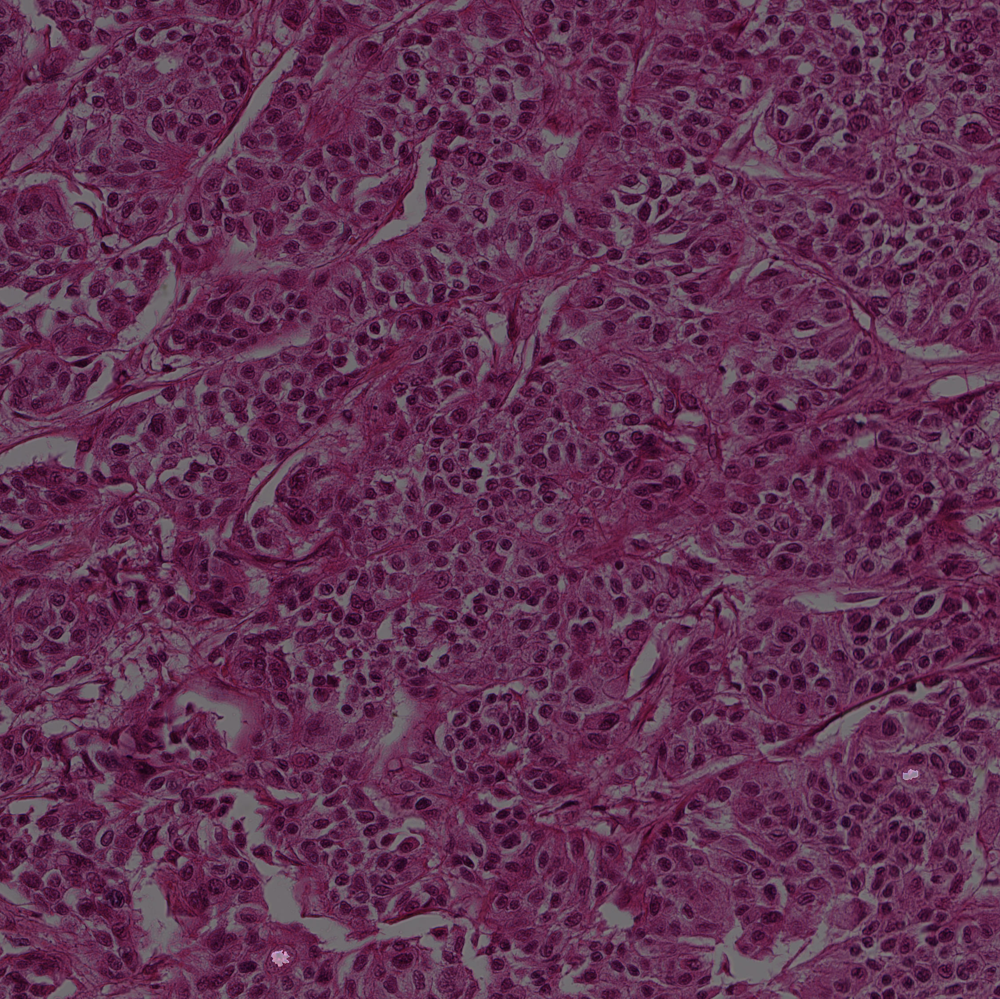

In [94]:
test_img= Image.open(img_path)
test_img = test_img.convert("RGBA")

test_mask = prediction_to_vis(np.squeeze(pred_mask))
test_mask = mask.resize(test_img.size)
test_mask = mask.convert("RGBA")

test_mask = test_mask.convert("RGBA")
overlay_img = Image.blend(test_img, test_mask, 0.5)
overlay_img

In [128]:
predicted_mask = pred.convert("RGBA")
input_image = img.squeeze(0).cpu().detach().numpy().convert("RGBA")
overlay_img = Image.blend(input_image, predicted_mask, 0.5)

AttributeError: 'Tensor' object has no attribute 'convert'

-------Original Image-------


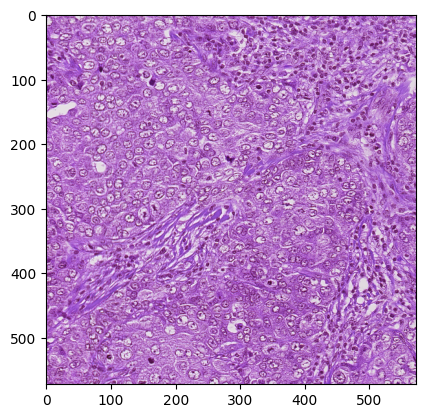

-------Image Mask-------


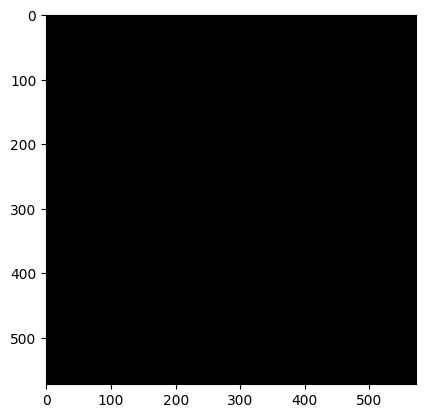

In [47]:
print("-------Original Image-------")
plt.imshow(display_test_img, cmap="gray")
plt.show()
print("-------Image Mask-------")
plt.imshow(mask,cmap="gray")
plt.show()